# Removing stressed cells from Set 1

In [1]:
#load packages
library(ggplot2)
library(magrittr)
library(data.table)
library(Seurat)
library(Matrix)
library(dplyr)
library(RColorBrewer)
library(MAST)
library(viridis)
library(mclust)
library(corrr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
 

In [2]:
#loading data
seu_HQC <- readRDS(file = "../../data/seurat_object/Set1/seu_HQC_Set1.obj")
seu_HQC

An object of class Seurat 
29258 features across 1243 samples within 2 assays 
Active assay: SCT (11662 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


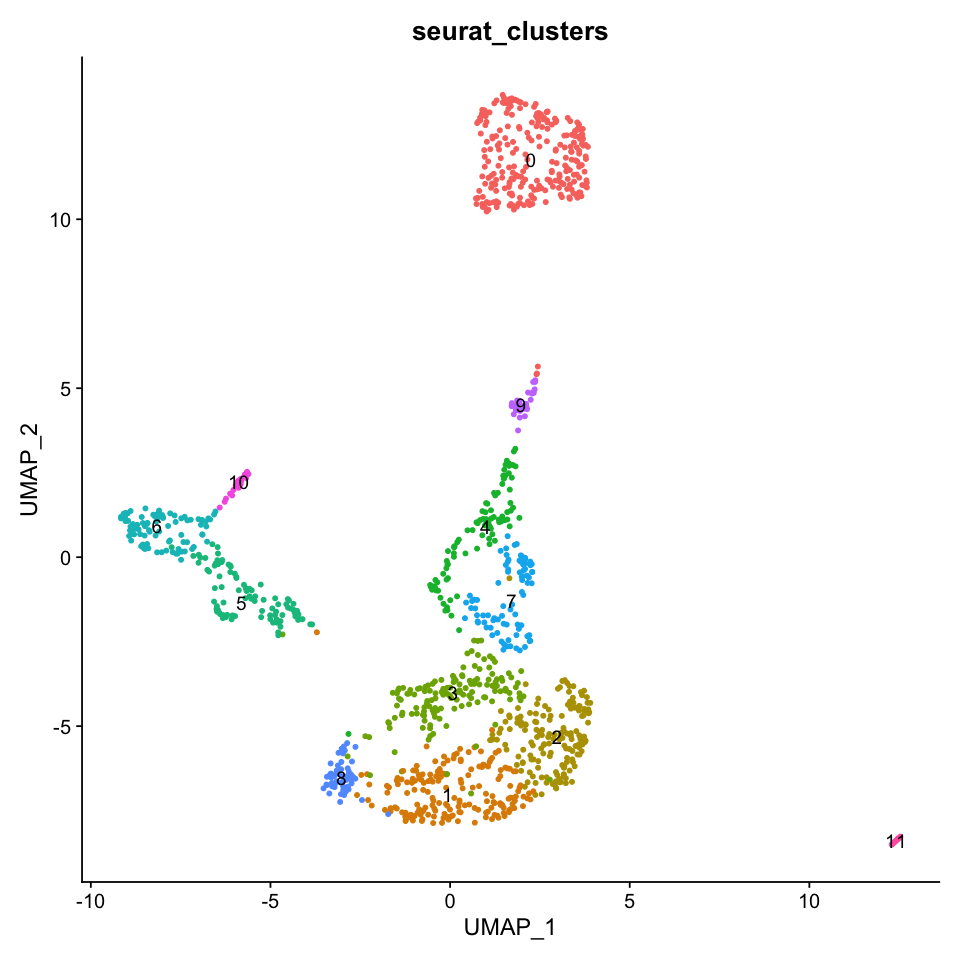

In [3]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'seurat_clusters') + NoLegend()

## Re-normalize without pole cells

In [4]:
seu_HQC_polecell <- subset(seu_HQC, ident = c(11))
seu_HQC_polecell

An object of class Seurat 
29258 features across 14 samples within 2 assays 
Active assay: SCT (11662 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [5]:
seu_HQC_woPC <- subset(seu_HQC, ident = c(11), invert = TRUE)
seu_HQC_woPC

An object of class Seurat 
29258 features across 1229 samples within 2 assays 
Active assay: SCT (11662 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [6]:
DefaultAssay(seu_HQC_woPC) <- "RNA"
seu_HQC_woPC <- suppressWarnings(SCTransform(seu_HQC_woPC, vars.to.regress = c("percent.mt", "percent.rRNA", "percent.ERCC")))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 11630 by 1229

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1229 cells



  |======================================================================| 100%


Second step: Get residuals using fitted parameters for 11630 genes



  |======================================================================| 100%


Computing corrected count matrix for 11630 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 10.216 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA, percent.ERCC

Centering data matrix

Set default assay to SCT



## Get tsr-correlated genes

In [7]:
HVG3000 <- VariableFeatures(seu_HQC_woPC)
is.ERCC <- grepl(pattern = '^ERCC', x = HVG3000)
HVG2000 <- head(HVG3000[!is.ERCC], 2000)
length(HVG2000)
head(HVG2000)
normcount <- GetAssayData(seu_HQC_woPC)
normcount <- as.data.frame(t(normcount))
tsr.count <- normcount$tsr
normcount <- normcount[,HVG2000]
normcount$tsr <- tsr.count
dim(normcount)

[1] 2000

[1] "salm"  "sog"   "zfh1"  "fkh"   "disco" "CadN"

[1] 1229 2000

In [8]:
corr <- correlate(normcount)
corr_tsr <- focus(corr, "tsr")
corr_tsr <- na.omit(corr_tsr)
corr_tsr[order(-corr_tsr$tsr), ]


Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




term,tsr
<chr>,<dbl>
His4r,0.7092363
smt3,0.6595340
SmF,0.6457924
Phf5a,0.6391526
UQCR-Q,0.6041319
CG41128,0.5838532
UQCR-11,0.5638439
Rpb11,0.5519230
CG8860,0.5484722


In [9]:
corr_tsr <- corr_tsr[corr_tsr$tsr >0.50| corr_tsr$tsr < -0.3, ]
dim(corr_tsr)
corr_tsr

[1] 25  2

term,tsr
<chr>,<dbl>
28SrRNA-Psi:CR45862,-0.3078602
E(spl)m7-HLH,-0.3108652
scyl,-0.3285851
E(spl)m5-HLH,-0.3147528
wech,-0.3317439
CG2865,-0.3382658
CG4440,0.5097122
CG41128,0.5838532
Sf3b5,0.5415397


In [10]:
normcount_tsr_corr <- normcount[, c("tsr", corr_tsr$term) ]
head(normcount_tsr_corr)
dim(normcount_tsr_corr)

,tsr,28SrRNA-Psi:CR45862,E(spl)m7-HLH,scyl,E(spl)m5-HLH,wech,CG2865,CG4440,CG41128,Sf3b5,⋯,RpL3,UQCR-11,CG8860,SmF,Phf5a,brat,Rpb11,spen,ND-MLRQ,zld
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
batch1_col1CATCTG,5.768321,6.897705,3.951244,5.081404,3.737670,6.142037,3.401197,5.955837,3.367296,4.127134,⋯,6.347389,4.262680,4.465908,4.304065,4.043051,4.882802,3.555348,4.595120,3.737670,5.023881
batch1_col1CGTCAT,6.298949,6.483107,2.302585,4.127134,2.397895,5.786897,3.135494,6.309918,4.948760,4.820282,⋯,6.175867,5.541264,4.948760,5.459586,4.672829,4.262680,5.087596,4.158883,5.159055,4.927254
batch1_col1CTAGTC,6.415097,6.612041,2.944439,4.795791,3.135494,6.135565,4.234107,6.089045,4.882802,4.672829,⋯,6.006353,5.204007,5.153292,4.262680,4.836282,4.276666,4.465908,4.110874,5.323010,4.836282
batch1_col1GACTCA,5.986452,6.852243,5.147494,6.006353,4.262680,6.124683,4.663439,6.054439,3.737670,4.174387,⋯,6.154858,4.158883,3.688879,4.189655,4.219508,4.955827,4.304065,5.003946,4.477337,5.579730
batch1_col1GCTGAT,6.104793,7.011214,5.147494,6.052089,4.094345,6.246107,4.060443,5.659482,3.663562,4.204693,⋯,6.139885,4.290459,4.488636,4.700480,4.553877,5.252273,3.988984,5.509388,4.454347,5.056246
batch1_col1GTCTAC,6.063785,7.077498,5.332719,6.538140,4.574711,5.594711,5.135798,5.616771,4.488636,2.995732,⋯,6.059123,4.844187,4.852030,4.682131,3.891820,4.997212,4.653960,4.727388,4.770685,5.749393


[1] 1229   26

## Clustering

In [11]:
pca<-prcomp(normcount_tsr_corr)
dim(pca$x)

[1] 1229   26

In [12]:
pca <- as.data.frame(pca$x)

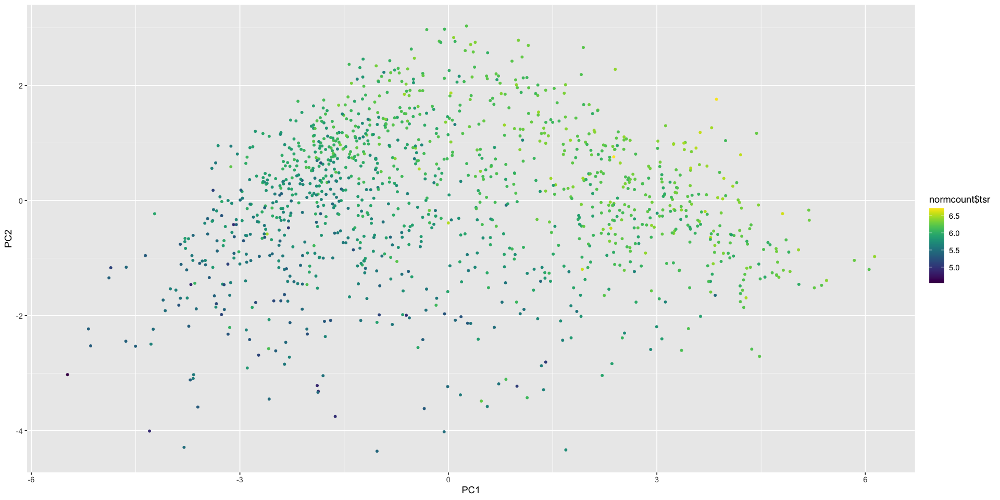

In [13]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC2 ,col = normcount$tsr))+ geom_point(size = 1)    + scale_color_viridis(option = "D")

In [14]:
mc <- Mclust(pca[,1:10],G=2,modelNames="VVV")
mc_result <- mc$classification 
mc_result <- as.data.frame(mc_result)
colnames(mc_result) <- c("stressed_ID_mc")
head(mc_result)

,stressed_ID_mc
,<dbl>
batch1_col1CATCTG,1
batch1_col1CGTCAT,1
batch1_col1CTAGTC,1
batch1_col1GACTCA,2
batch1_col1GCTGAT,2
batch1_col1GTCTAC,2


In [15]:
length(mc_result[mc_result$stressed_ID_mc==1, ])
length(mc_result[mc_result$stressed_ID_mc==2, ])

[1] 640

[1] 589

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,stressed_ID_mc
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
batch1_col1CATCTG,-0.4421896,-0.1176910,-1.0748776,-0.1605031,0.1455216,0.1872060,0.3004207,-0.2694355,0.05214893,-0.06500584,⋯,-0.11040741,-0.25561742,-0.1205823,-0.3328757,0.04009506,-0.027050522,0.21358762,0.06990996,0.16538774,1
batch1_col1CGTCAT,3.4090475,1.0073630,-0.9462532,0.1084817,0.6068190,0.1654290,-0.4934059,-0.3088417,-0.34459836,-0.31012249,⋯,-0.09885251,0.02803034,-0.1210238,-0.1272022,0.09283565,-0.008245494,0.10002267,0.13404681,-0.06675558,1
batch1_col1CTAGTC,2.0970428,1.2204122,-0.7135328,1.7763550,0.2296468,-0.0780851,0.4171826,0.1814938,-0.19053223,0.29697457,⋯,-0.33281259,-0.16273303,0.1169515,-0.1628335,0.06989516,0.311605018,-0.05313093,-0.04646934,-0.04887442,1
batch1_col1GACTCA,-1.6437220,0.8011147,0.1331034,0.3666111,0.1634981,0.2241752,0.3851966,0.6619244,-0.72859282,0.32304543,⋯,-0.15865224,-0.33631825,0.1550510,-0.2514747,-0.07251272,0.059135633,0.05777849,0.10168918,0.12732352,2
batch1_col1GCTGAT,-1.4075869,0.8483704,0.1420108,-0.6411261,0.2787785,-0.1027909,0.2062412,0.4658672,-0.35928682,0.20712038,⋯,-0.01755581,0.19121565,-0.1374041,-0.0484481,0.22335792,0.142762468,-0.07584809,-0.05326351,0.17465666,2
batch1_col1GTCTAC,-1.8435793,1.4376407,0.9914128,-0.3957365,1.0291440,-0.4175170,-1.6208937,0.4497585,-0.33474923,0.25901629,⋯,-0.35164007,-0.18387180,-0.3536833,0.4138929,0.38228729,0.352025857,0.13395637,0.18971896,-0.01745934,2


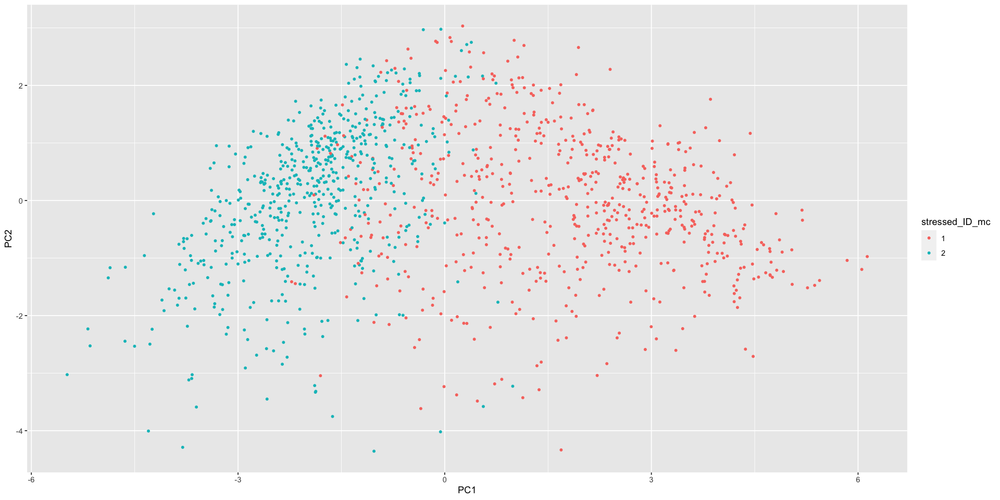

In [16]:
pca$stressed_ID_mc <- as.factor(mc_result$stressed_ID_mc)
head(pca)

options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC2 ,col = stressed_ID_mc))+ geom_point(size =1) 

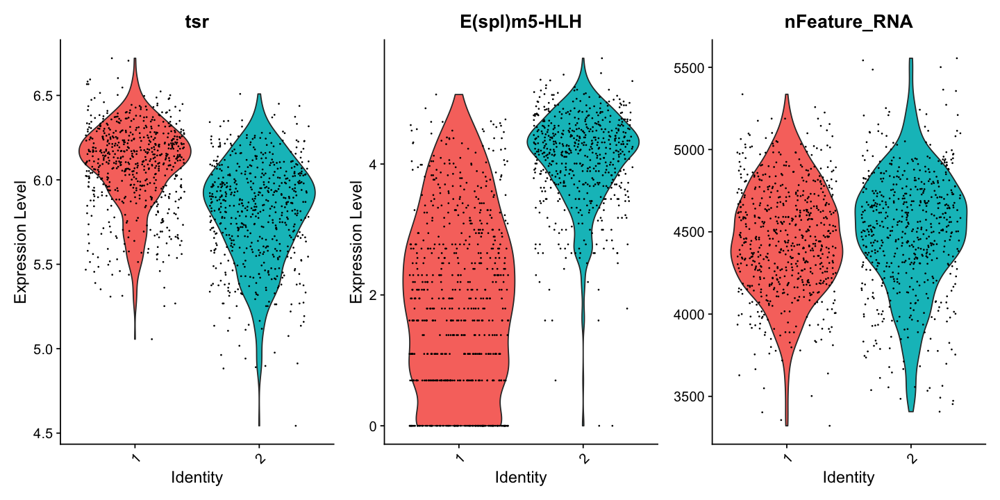

In [17]:
seu_HQC_woPC$stressed_ID <- mc_result$stressed_ID
Idents(seu_HQC_woPC) <- "stressed_ID"
options(repr.plot.width=12, repr.plot.height=6)
VlnPlot(seu_HQC_woPC, c("tsr","E(spl)m5-HLH",'nFeature_RNA'), pt.size = 0.1)

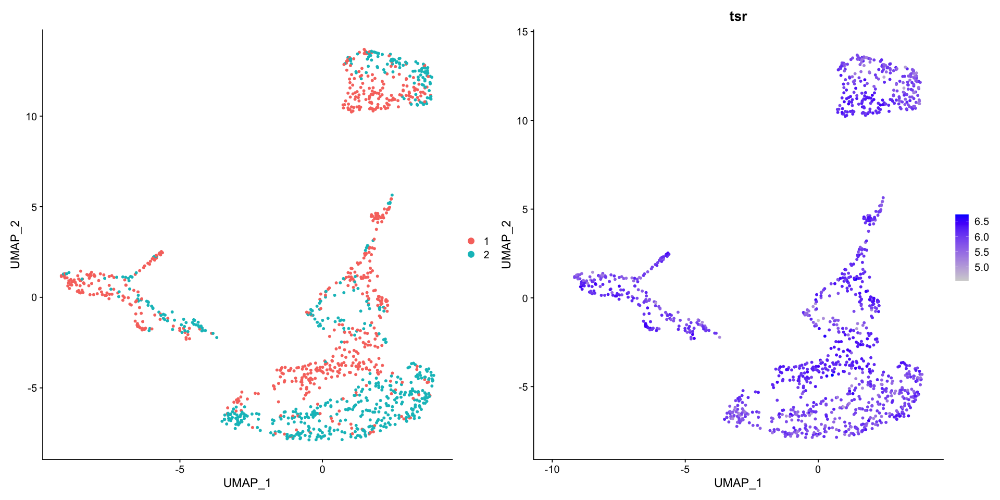

In [18]:
options(repr.plot.width=16, repr.plot.height=8)
p1 <- DimPlot(seu_HQC_woPC, reduction =  "umap", label = F) 
p2 <- FeaturePlot(seu_HQC_woPC, features = 'tsr', reduction = 'umap')
plot(p1+p2)

In [19]:
seu_HQC_woPC_2 <- subset(seu_HQC_woPC, idents = 2)

In [20]:
seu_HQC_woPC_2 <- RunPCA(seu_HQC_woPC_2)
seu_HQC_woPC_2 <- RunUMAP(seu_HQC_woPC_2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_woPC_2 <- FindNeighbors(seu_HQC_woPC_2, dims = 1:30)
seu_HQC_woPC_2 <- FindClusters(seu_HQC_woPC_2)

PC_ 1 
Positive:  Brd, E(spl)malpha-BFM, ths, Lac, SoxN, ImpL2, esg, E(spl)mgamma-HLH, Tom, E(spl)m7-HLH 
	   CG34224, sca, Dl, hth, E(spl)m5-HLH, E(spl)m4-BFM, CG15480, toc, aop, sdt 
	   Trim9, E(spl)m2-BFM, Tet, sog, CG5059, Ocho, E(spl)mdelta-HLH, Meltrin, brk, CG17724-Kdm4B-seq 
Negative:  zfh1, CadN, twi, stumps, sna, hll, Ilp4, Mef2, sprt, Cyp310a1 
	   Act87E, htl, CG3036, CG11357, NetA, lncRNA:CR45361, ltl, if, VepD, CG1673 
	   Mes2, sty, NetB, Myc, CG14688, CG43355-sala, be, Tis11, rib, CG16758 
PC_ 2 
Positive:  tup, mirr, ush, egr, lncRNA:CR43432, hbs, emc, pnr, Alk, CG14427 
	   srp, Doc1, Ama, cv-2, CG45263, peb, Ance, kay, Dtg, dap 
	   Doc2, dpp, Svil, C15, rst, net, cno, btsz, Btk29A, lncRNA:CR43887 
Negative:  SoxN, sog, sca, ths, brk, ImpL2, D, Toll-6, Tet, Tollo 
	   Meltrin, esg, CG17724-Kdm4B-seq, pnt, Dl, path, tkv, rdx, Cys, pros 
	   vnd, CG43355-sala, siz, l(1)sc, HnRNP-K, Trim9, hth, pyr, slp2, slp1 
PC_ 3 
Positive:  RpL41, RpL39, disco, CG13427, salm, 28Sr

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 589
Number of edges: 19086

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7579
Number of communities: 6
Elapsed time: 0 seconds


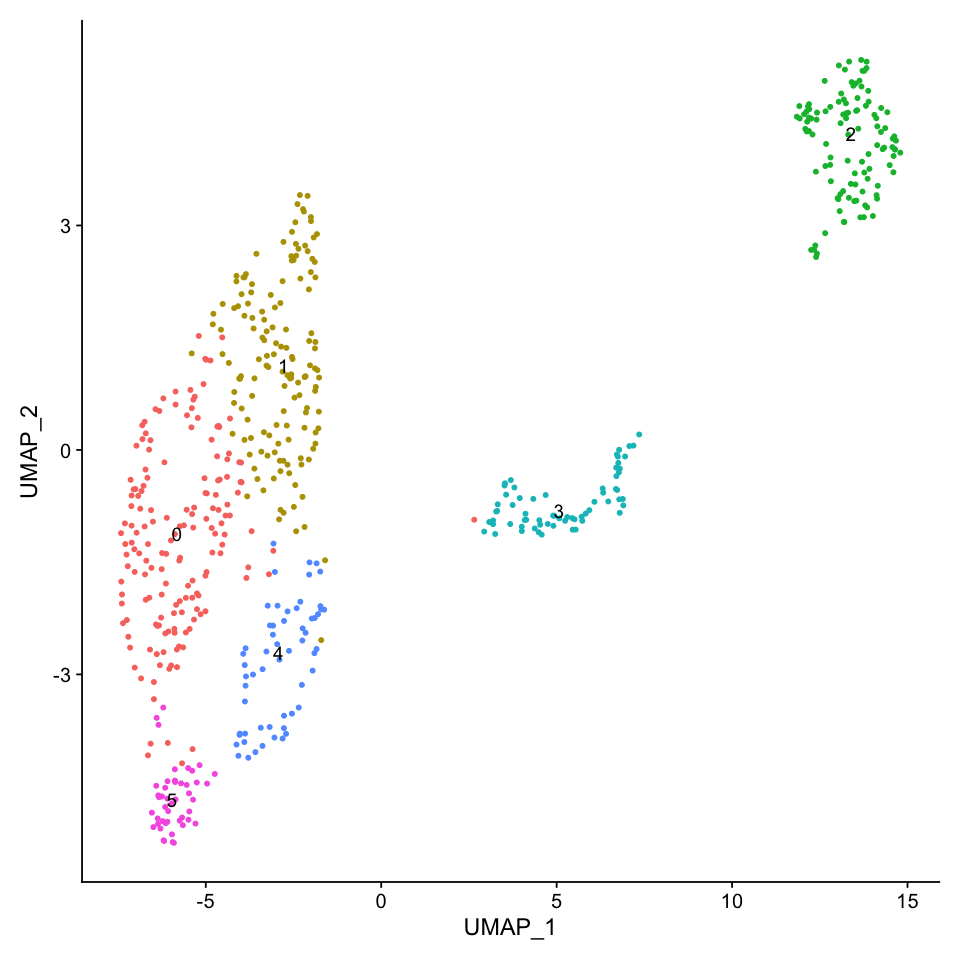

In [21]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_woPC_2, reduction =  "umap", label = TRUE) + NoLegend()

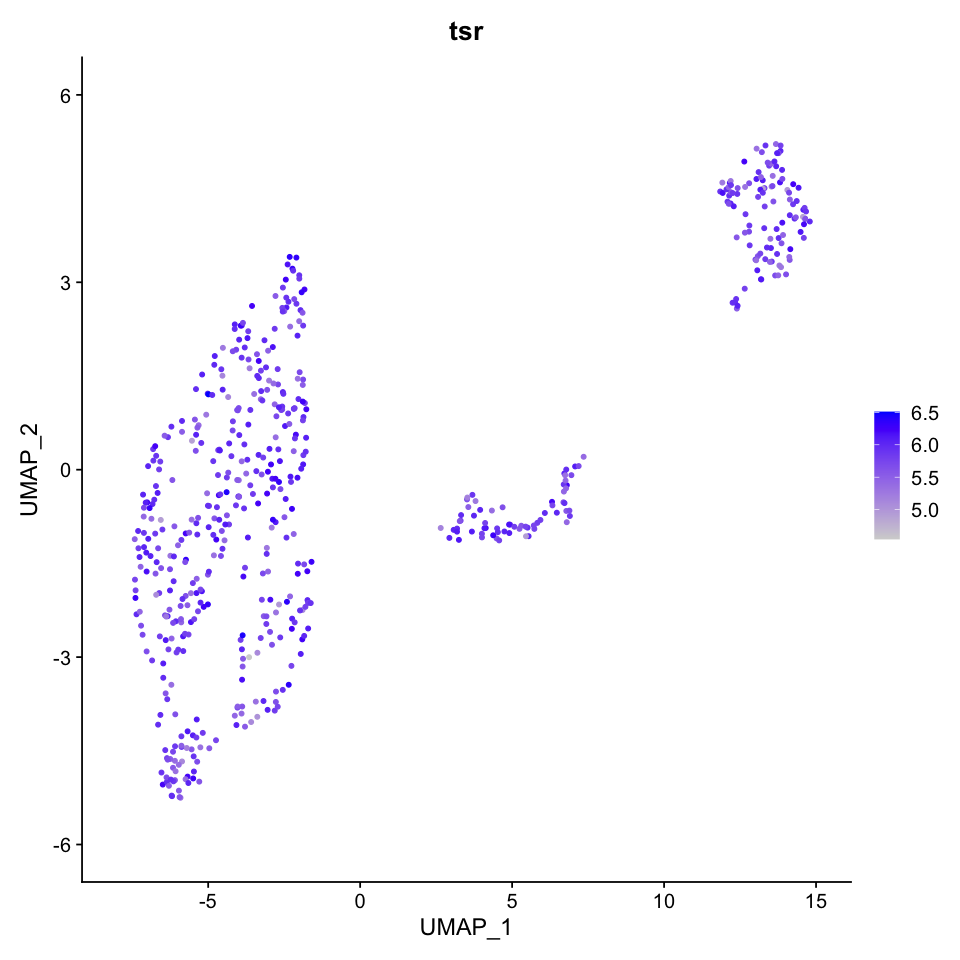

In [22]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_woPC_2, features = 'tsr', reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 589
Number of edges: 19086

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5684
Number of communities: 9
Elapsed time: 0 seconds


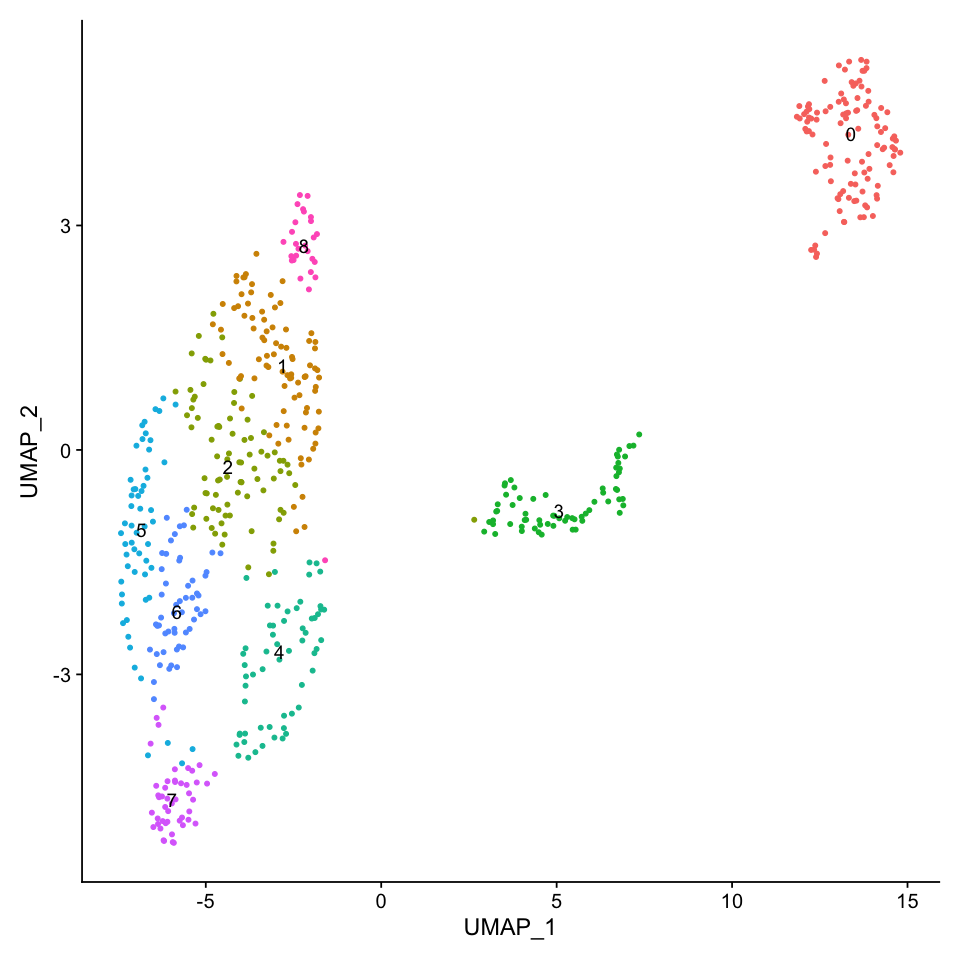

In [23]:
seu_HQC_woPC_2 <- FindClusters(seu_HQC_woPC_2, resolution = 2.0)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_woPC_2, reduction =  "umap", label = TRUE) + NoLegend()

In [24]:
all.markers <- FindAllMarkers(object = seu_HQC_woPC_2, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



[1] 2120

[1] 90

Warning message in DoHeatmap(seu_HQC_woPC_2, features = c("tsr", all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Cln7”


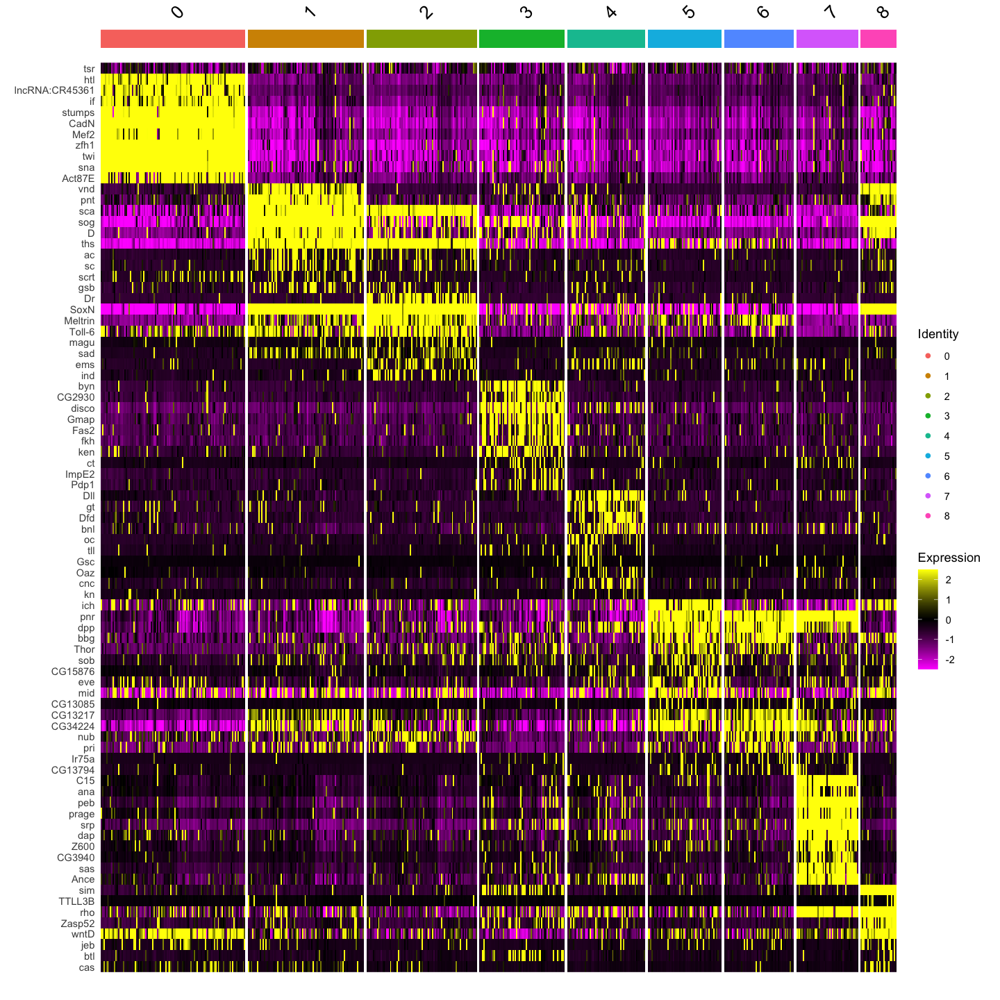

In [25]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_woPC_2, features = c('tsr',all.markers.top10$gene))

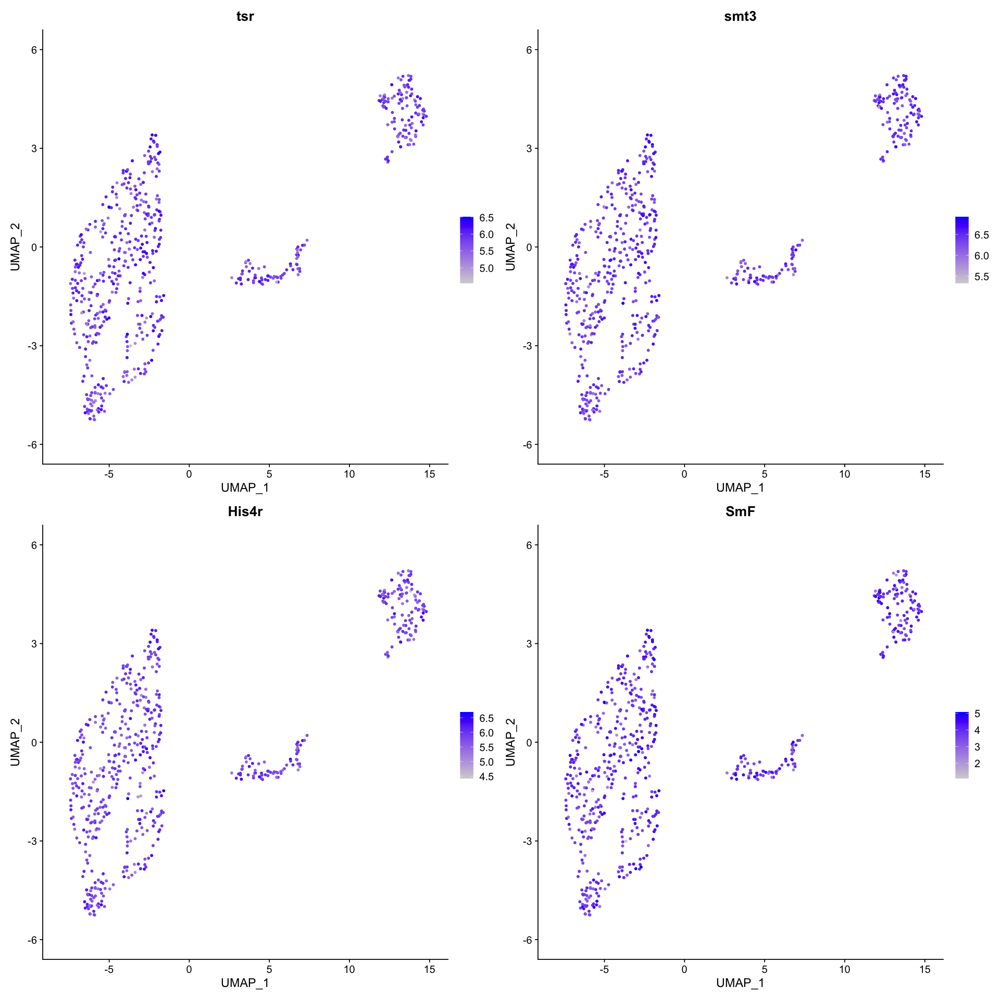

In [26]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_woPC_2, features = c('tsr', 'smt3', 'His4r', 'SmF'), reduction = 'umap')

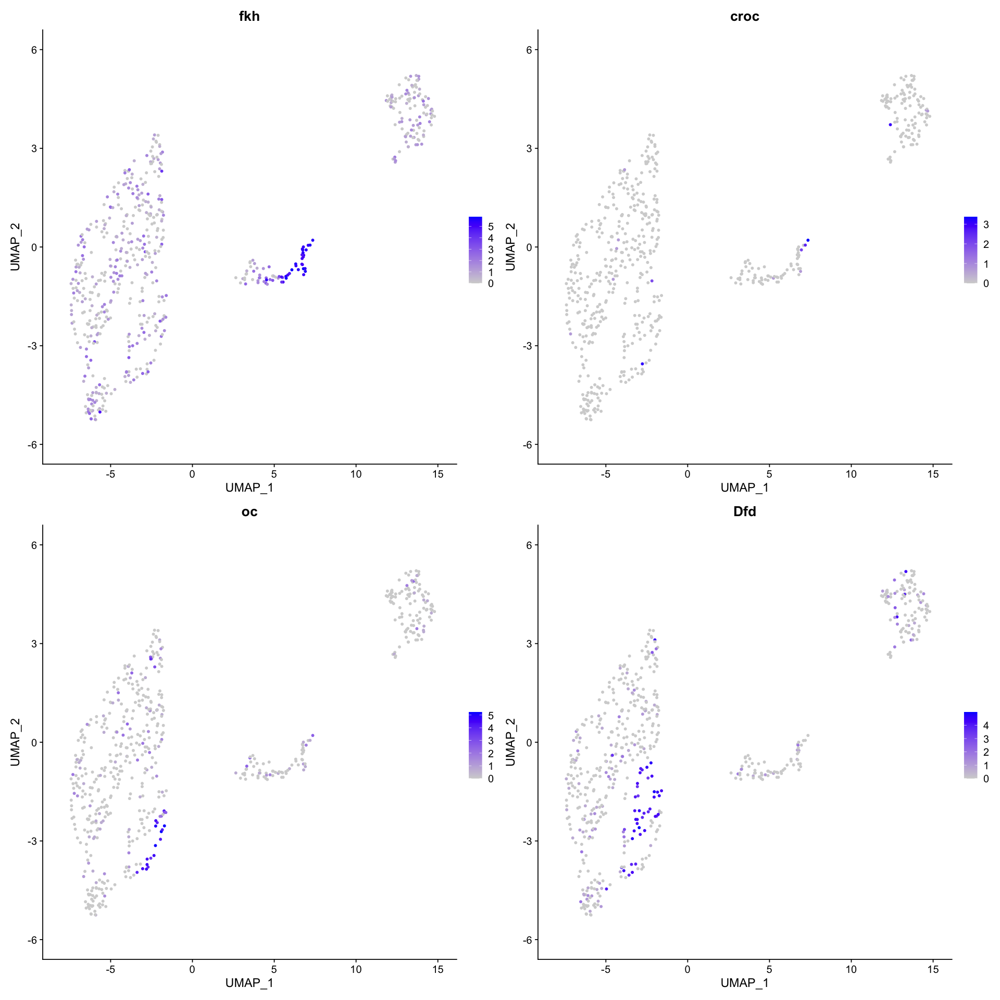

In [27]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_woPC_2, features = c('fkh', 'croc', 'oc','Dfd'), reduction = 'umap')

Excessive removal in the head region.  
Remove only the population with tsr-high in trunk mesoderm and ectoderm.

## Remove tsr-high cells in trunk mesoderm and ectoderm.

PC_ 1 
Positive:  Lac, SoxN, ths, Brd, ImpL2, E(spl)malpha-BFM, Tom, CG34224, Ptr, Dl 
	   hth, sdt, sca, esg, sog, CG5059, aop, E(spl)mgamma-HLH, E(spl)m4-BFM, E(spl)m7-HLH 
	   CG13427, Ocho, blot, Meltrin, grh, Trim9, ASPP, CG15628, E(spl)m5-HLH, Tet 
Negative:  zfh1, CadN, twi, stumps, Ilp4, hll, sna, Mef2, Cyp310a1, sprt 
	   NetA, htl, VepD, CG3036, Act87E, CG11357, if, ltl, Mes2, Nplp2 
	   sty, NetB, CG1673, CG43355-sala, lncRNA:CR45361, CG14688, be, Myc, Tis11, CG16758 
PC_ 2 
Positive:  fkh, Gmap, Pepck-CG45087, Fas2, ps, CG2930, disco, peb, srp, ImpE2 
	   mnd, Oatp74D, Pdp1, tup, RpL41, Lapsyn, bnb, sas, Doc1, CG15236 
	   RpL39, byn, Notum, Dscam2, hkb, phu, ush, CG13427, MFS14, rib 
Negative:  stg, tsh, SoxN, ImpL2, ths, sca, hth, wntD, tkv, Toll-6 
	   Ubx, Ilp4, E(spl)m7-HLH, esg, mid, Antp, E(spl)mgamma-HLH, slp1, E(spl)malpha-BFM, CadN 
	   trn, sty, Mef2, comm, zfh1, twi, 28SrRNA-Psi:CR45862, pigs, E(spl)m8-HLH, Brd 
PC_ 3 
Positive:  SoxN, sog, ths, sca, 28SrRNA-Psi

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1229
Number of edges: 37989

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6958
Number of communities: 17
Elapsed time: 0 seconds


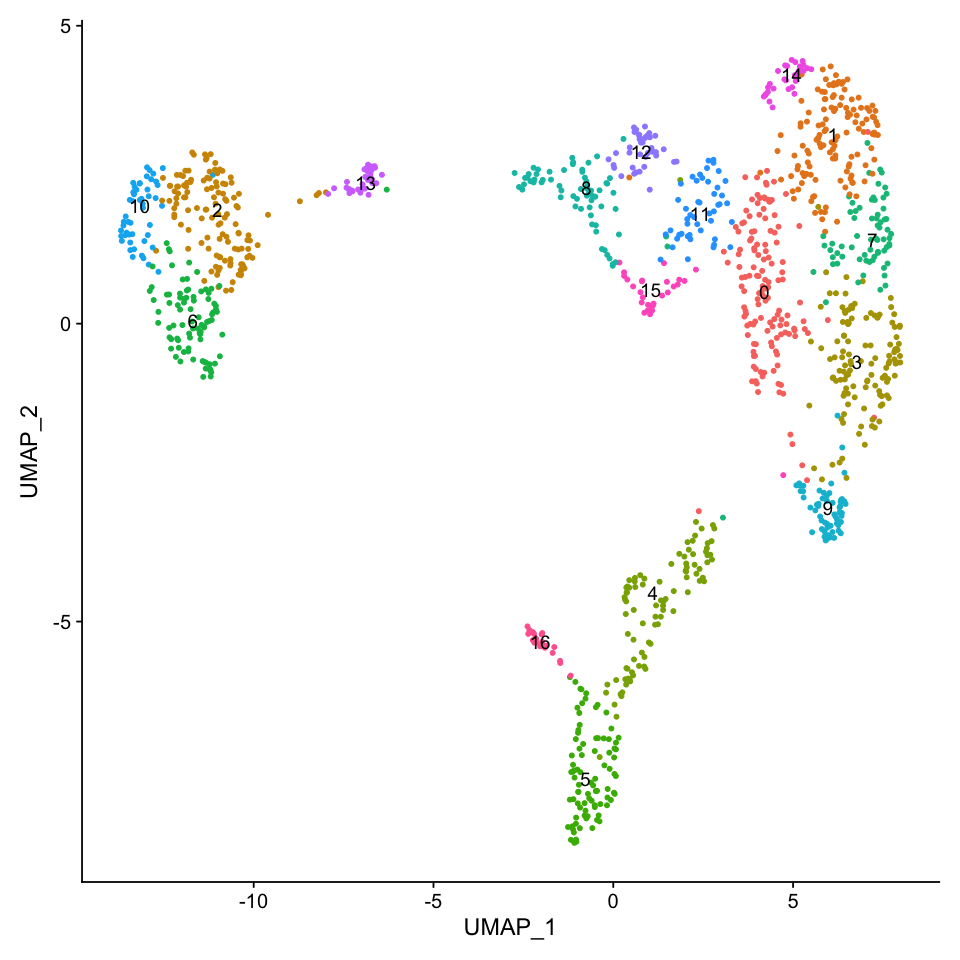

In [28]:
seu_HQC_woPC <- RunPCA(seu_HQC_woPC)
seu_HQC_woPC <- RunUMAP(seu_HQC_woPC, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_woPC <- FindNeighbors(seu_HQC_woPC, dims = 1:30)
seu_HQC_woPC <- FindClusters(seu_HQC_woPC, resolution = 2.0)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_woPC, reduction =  "umap", label = TRUE) + NoLegend()

In [29]:
all.markers <- FindAllMarkers(object = seu_HQC_woPC, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16



[1] 5984

[1] 170

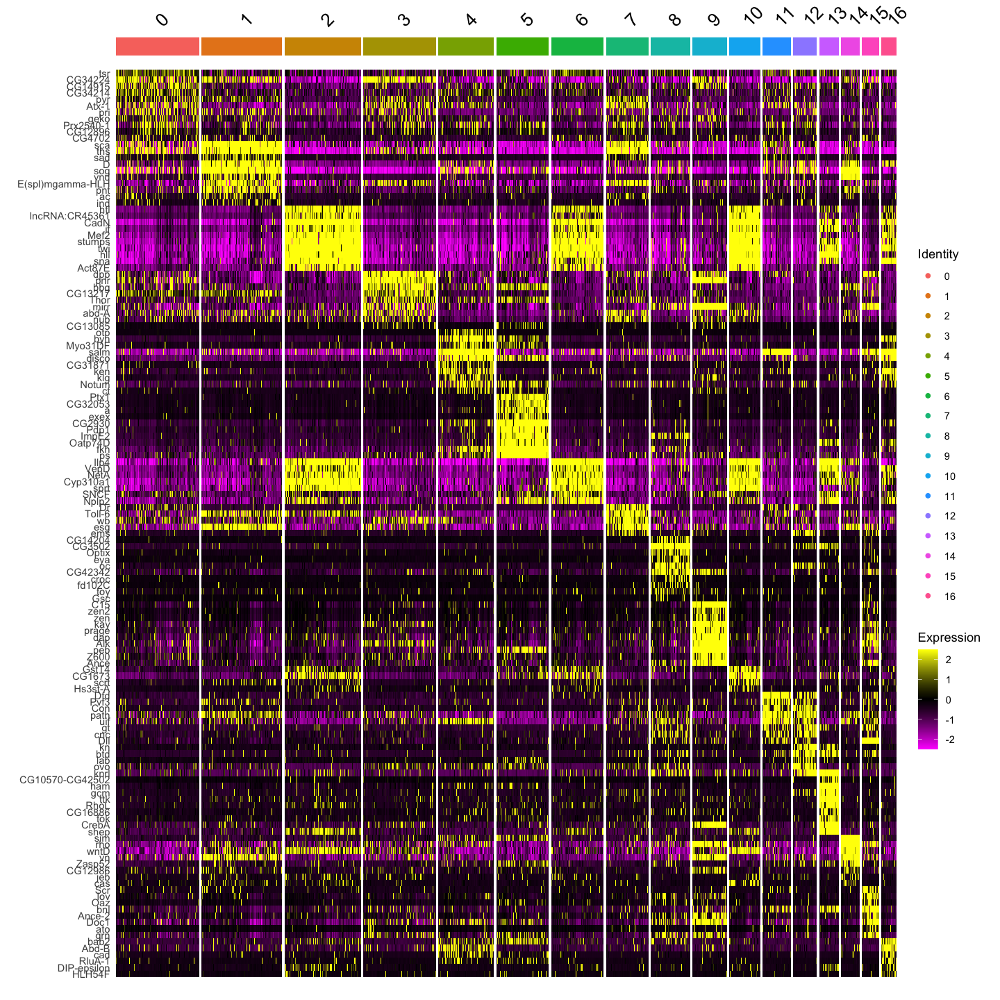

In [30]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_woPC, features = c('tsr',all.markers.top10$gene))

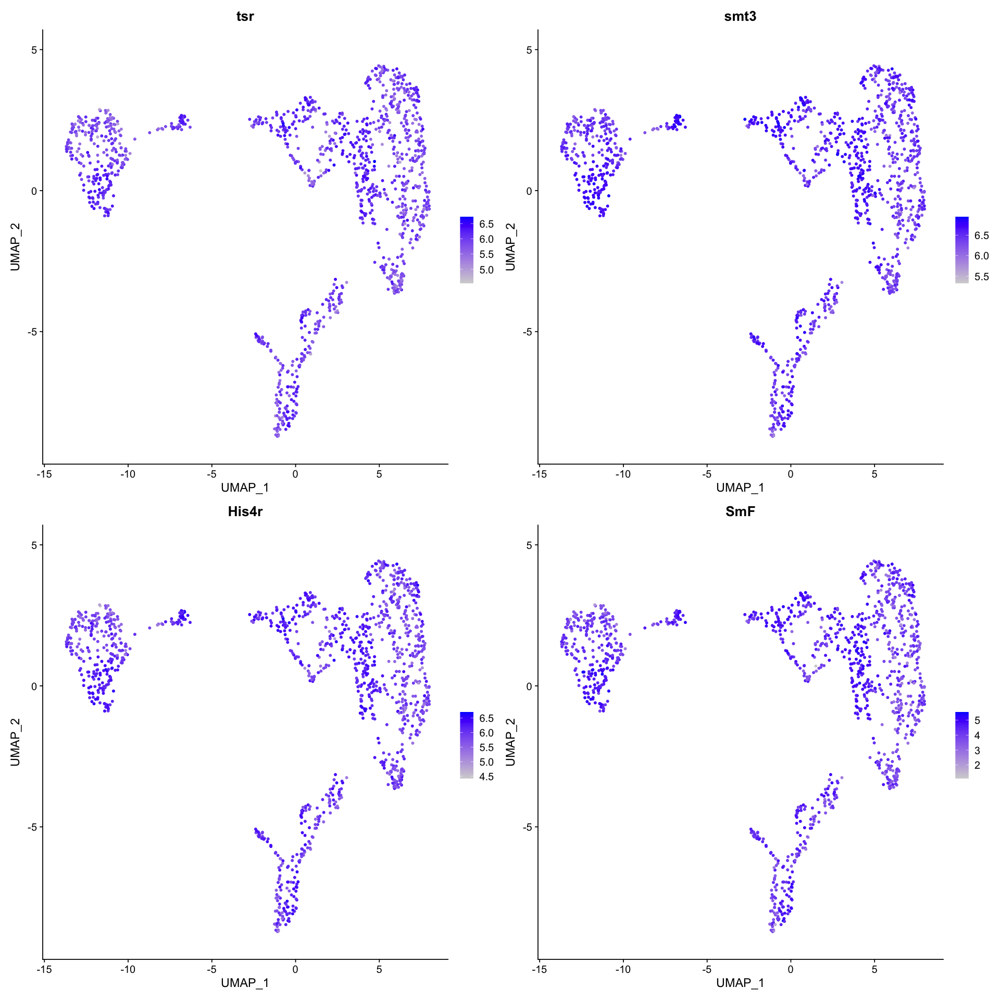

In [31]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_woPC, features = c('tsr', 'smt3', 'His4r', 'SmF'), reduction = 'umap')

In [32]:
seu_HQC_stressed <- subset(seu_HQC_woPC, idents = c(0,6))
seu_HQC_nonstressed <- subset(seu_HQC, cells = colnames(seu_HQC_stressed), invert = T)
seu_HQC_stressed
seu_HQC_nonstressed

An object of class Seurat 
29226 features across 225 samples within 2 assays 
Active assay: SCT (11630 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
29258 features across 1018 samples within 2 assays 
Active assay: SCT (11662 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

## Re-normalize and clustering without stressed cells

In [33]:
DefaultAssay(seu_HQC_nonstressed) <- 'RNA'
seu_HQC_nonstressed <- suppressWarnings(SCTransform(seu_HQC_nonstressed, vars.to.regress = c("percent.mt", "percent.rRNA", "percent.ERCC")))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 11281 by 1018

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1018 cells



  |======================================================================| 100%


Second step: Get residuals using fitted parameters for 11281 genes



  |======================================================================| 100%


Computing corrected count matrix for 11281 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 10.70938 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA, percent.ERCC

Centering data matrix

Set default assay to SCT



In [34]:
seu_HQC_nonstressed <- RunPCA(seu_HQC_nonstressed)
seu_HQC_nonstressed <- RunUMAP(seu_HQC_nonstressed, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_nonstressed <- FindNeighbors(seu_HQC_nonstressed, dims = 1:30)
seu_HQC_nonstressed <- FindClusters(seu_HQC_nonstressed)

PC_ 1 
Positive:  Lac, Brd, ths, SoxN, Tom, ImpL2, E(spl)malpha-BFM, hth, CG34224, esg 
	   Ptr, sdt, CG5059, Dl, sca, E(spl)mgamma-HLH, aop, E(spl)m4-BFM, sog, blot 
	   Ocho, grh, CG15628, Trim9, ASPP, Meltrin, CG15480, E(spl)m7-HLH, ci, Tet 
Negative:  zfh1, CadN, twi, sna, hll, stumps, Ilp4, Mef2, Cyp310a1, sprt 
	   VepD, CG3036, htl, Mes2, if, ltl, NetA, CG11357, Act87E, lncRNA:CR45361 
	   NetB, sty, CG1673, Nplp2, Tis11, Myc, be, CG14688, CG43355-sala, CG16758 
PC_ 2 
Positive:  fkh, Gmap, Pepck-CG45087, Fas2, disco, ps, CG2930, ImpE2, mnd, peb 
	   Oatp74D, Pdp1, srp, RpL41, bnb, Lapsyn, RpL39, CG15236, sas, Notum 
	   byn, Doc1, hkb, tup, aay, Dscam2, CG13427, Ptx1, a, phu 
Negative:  tsh, stg, hth, Ubx, Ilp4, tkv, wntD, ImpL2, CadN, Antp 
	   opa, sty, Mef2, twi, slp1, Toll-6, mid, zfh1, sca, trn 
	   ths, SoxN, stumps, pigs, sna, dan, NetA, CG11357, comm, htl 
PC_ 3 
Positive:  SoxN, sog, sca, brk, ths, D, rdx, CG43355-sala, path, Tet 
	   ImpL2, Meltrin, Tollo, pros, Toll-

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1018
Number of edges: 30728

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8335
Number of communities: 11
Elapsed time: 0 seconds


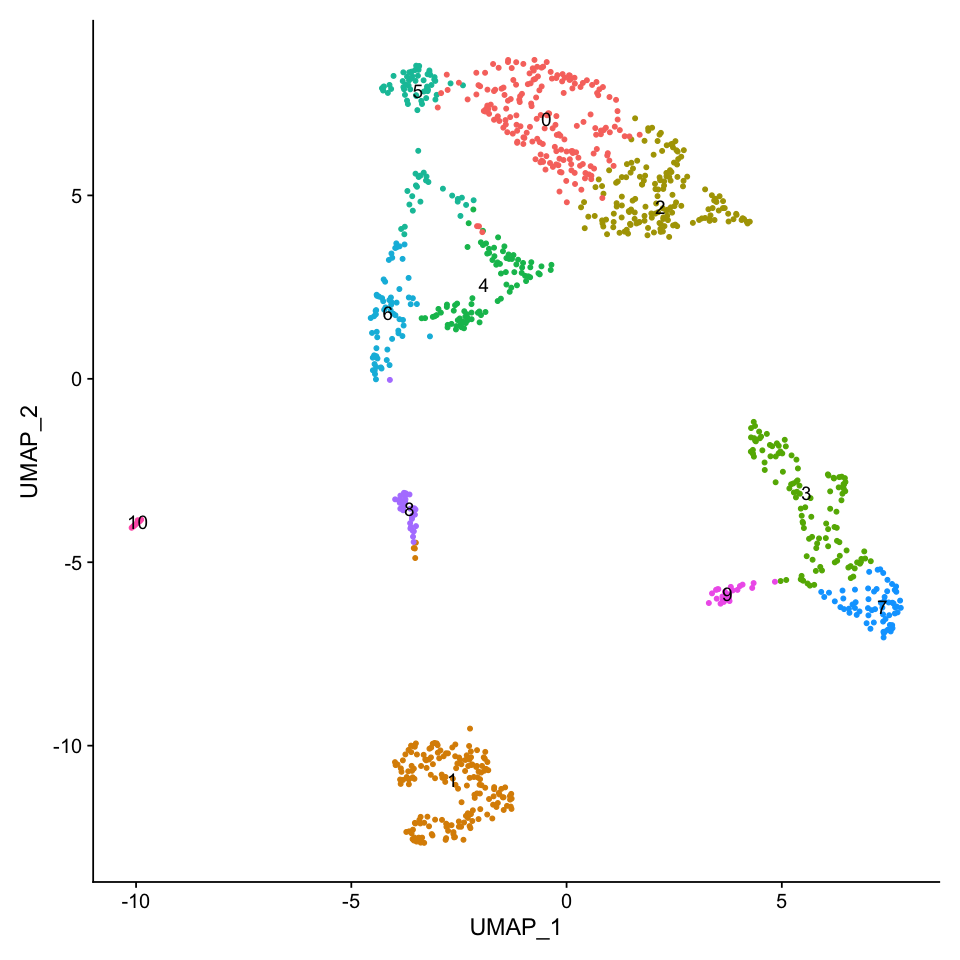

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_nonstressed, reduction =  "umap", label = TRUE) + NoLegend()

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1018
Number of edges: 30728

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7024
Number of communities: 17
Elapsed time: 0 seconds


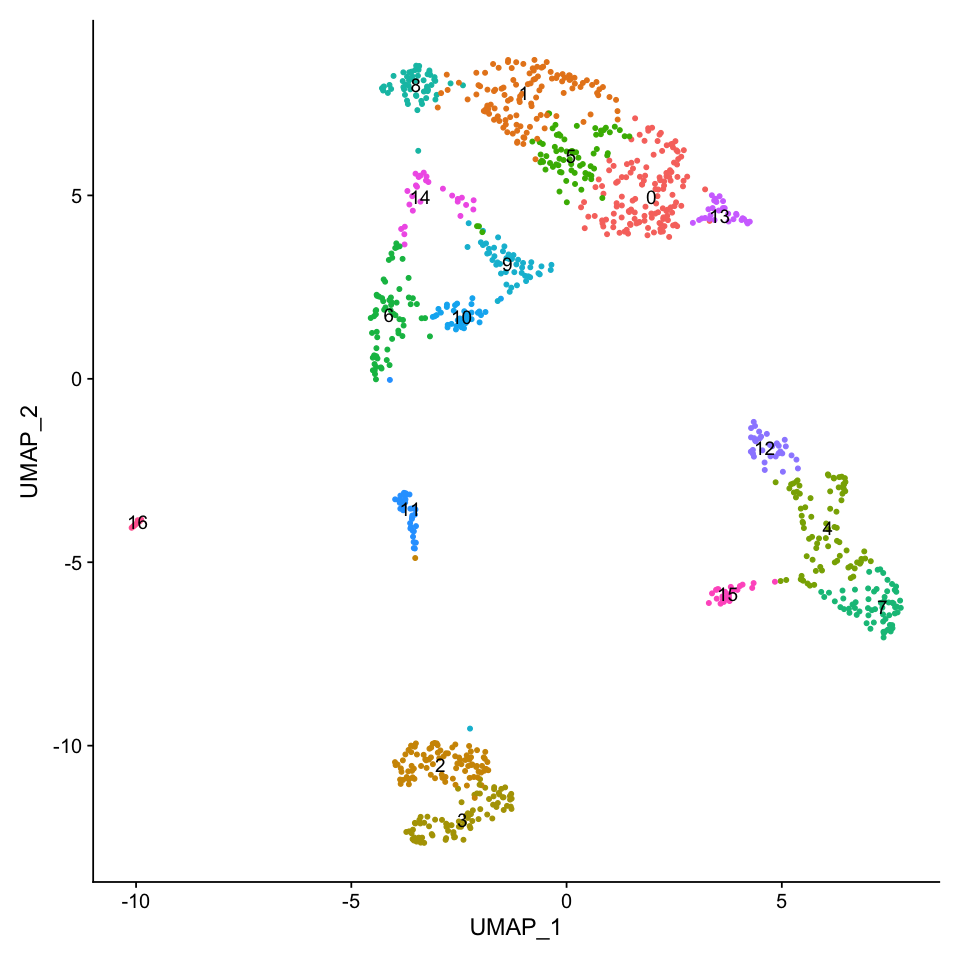

In [36]:
seu_HQC_nonstressed <- FindClusters(seu_HQC_nonstressed,resolution = 2.0)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_nonstressed, reduction =  "umap", label = TRUE) + NoLegend()

In [37]:
all.markers <- FindAllMarkers(object = seu_HQC_nonstressed, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16



[1] 6653

[1] 170

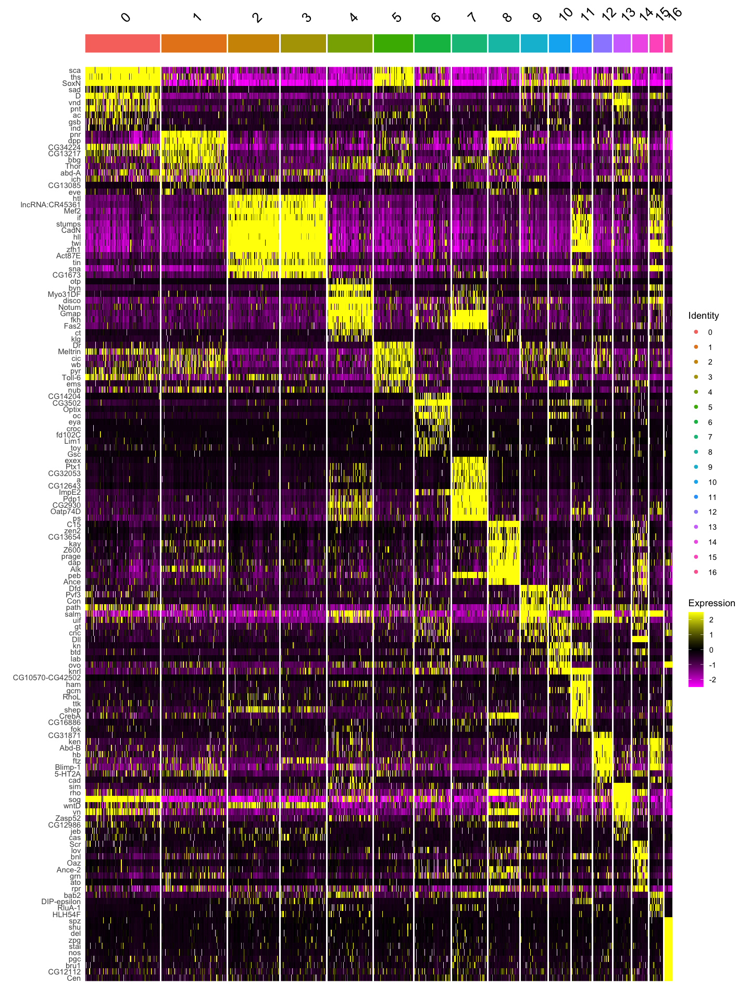

In [38]:
options(repr.plot.width=12, repr.plot.height=16)
DoHeatmap(seu_HQC_nonstressed, features = c(all.markers.top10$gene))

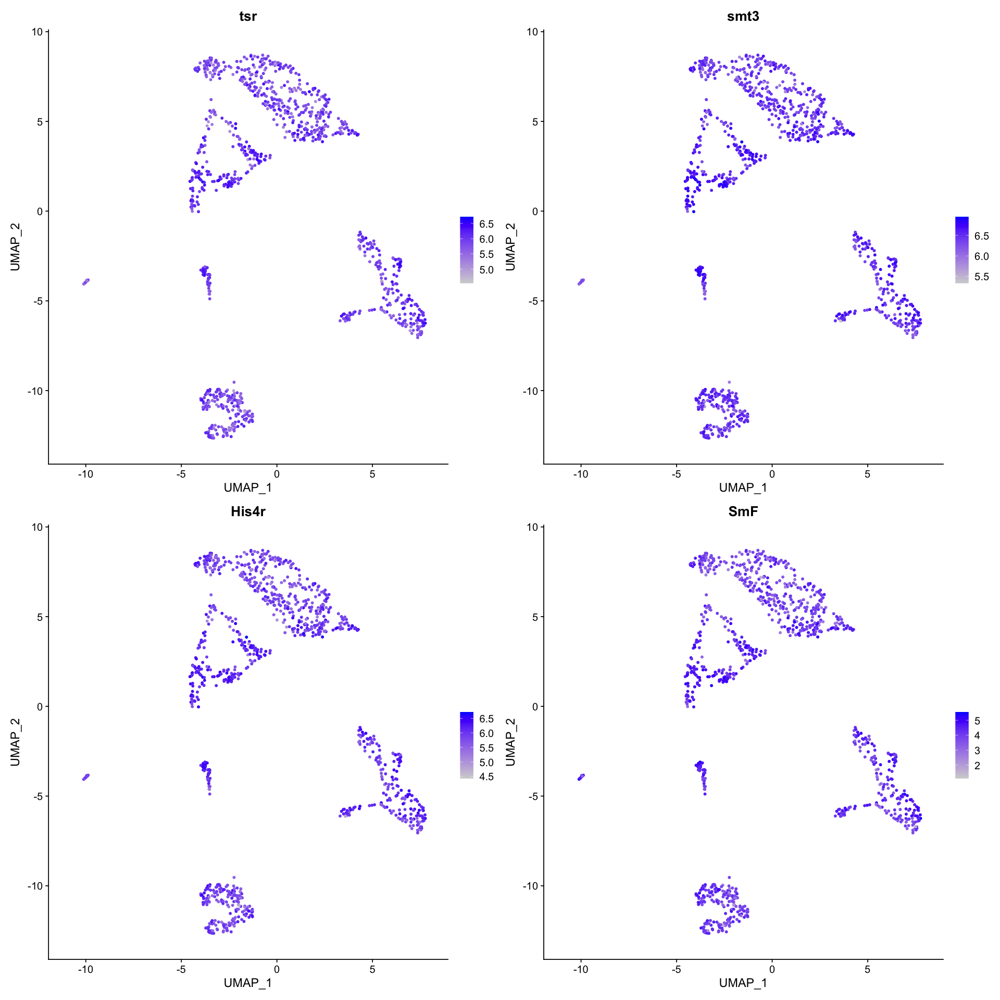

In [39]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('tsr', 'smt3', 'His4r', 'SmF'), reduction = 'umap')

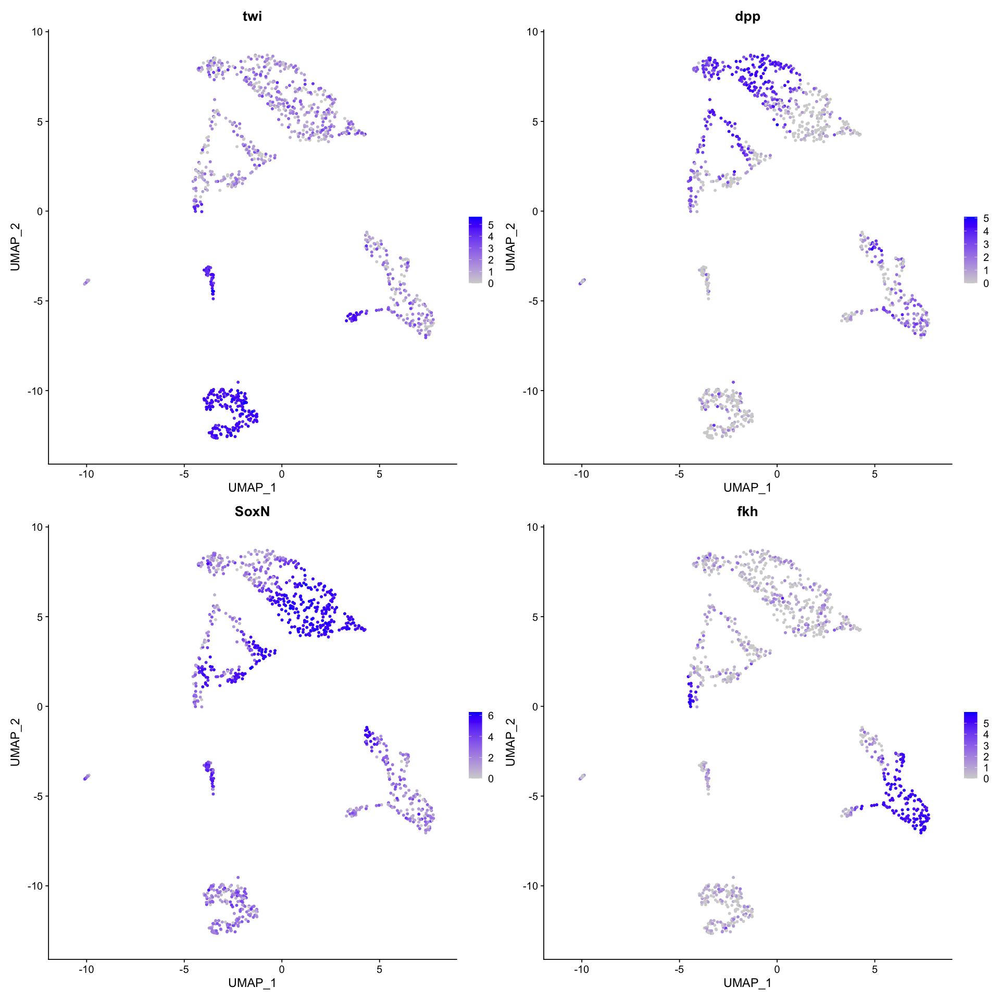

In [40]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('twi', 'dpp', 'SoxN', 'fkh'), reduction = 'umap')

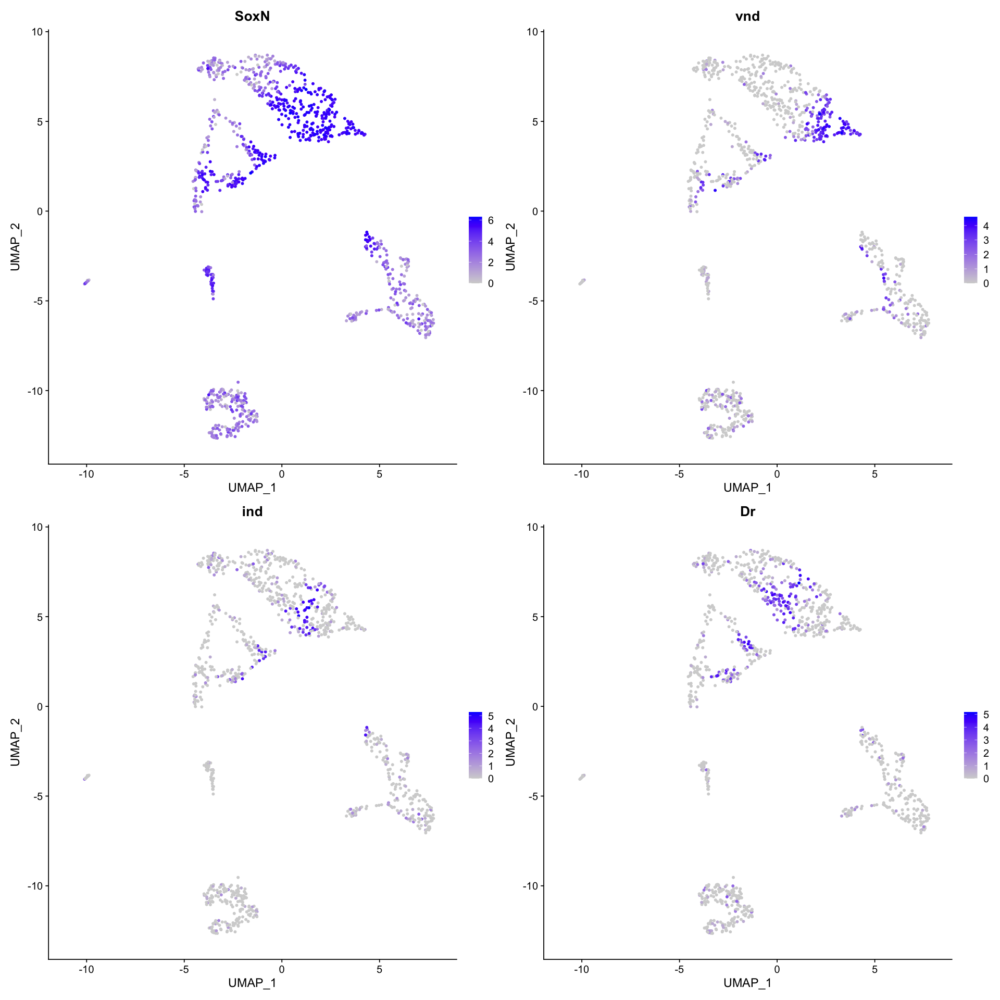

In [41]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('SoxN', 'vnd', 'ind', 'Dr'), reduction = 'umap')

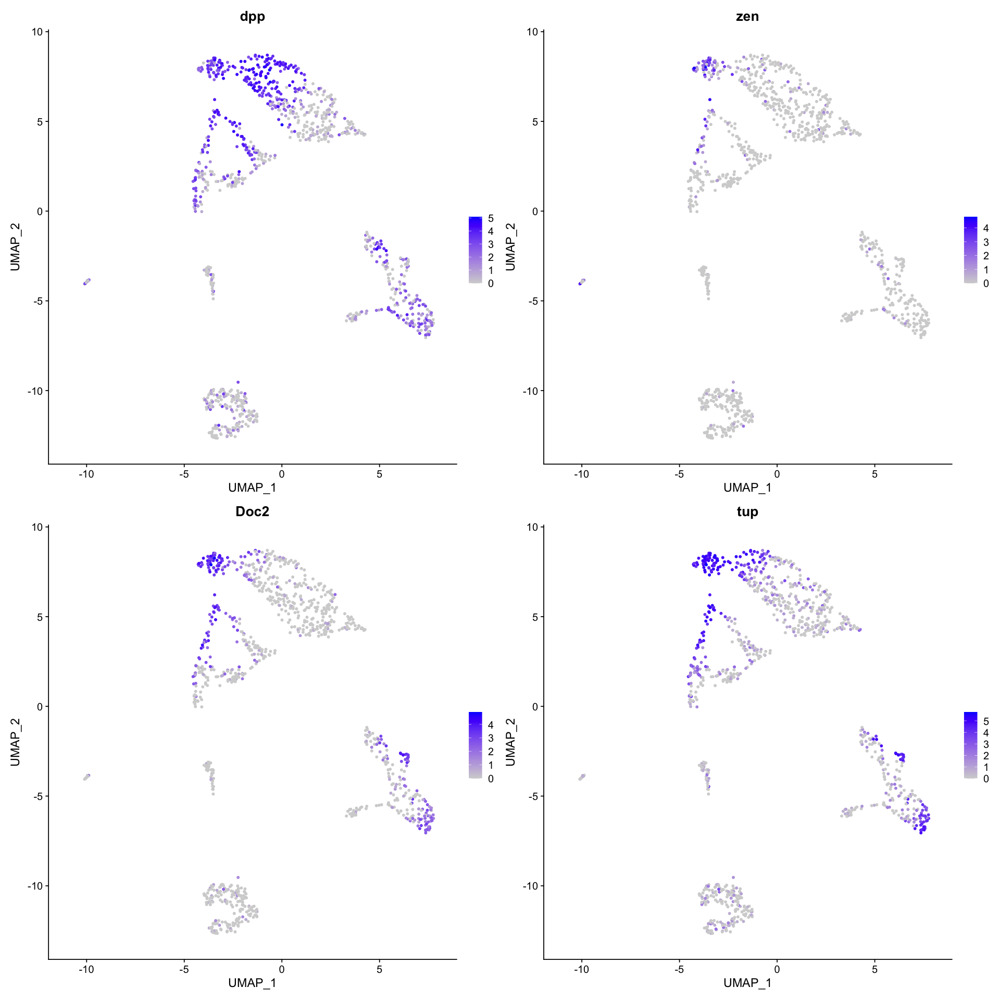

In [42]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('dpp', 'zen', 'Doc2', 'tup'), reduction = 'umap')

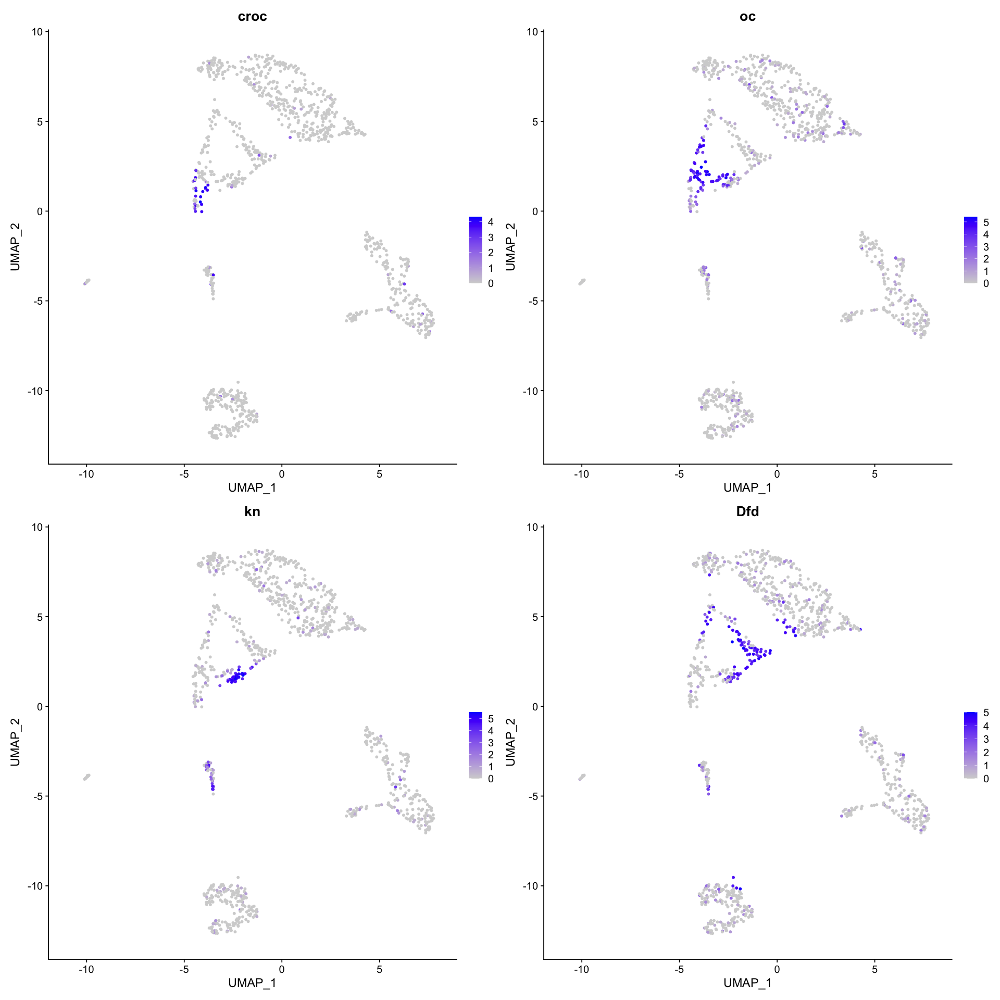

In [43]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('croc', 'oc', 'kn', 'Dfd'), reduction = 'umap')

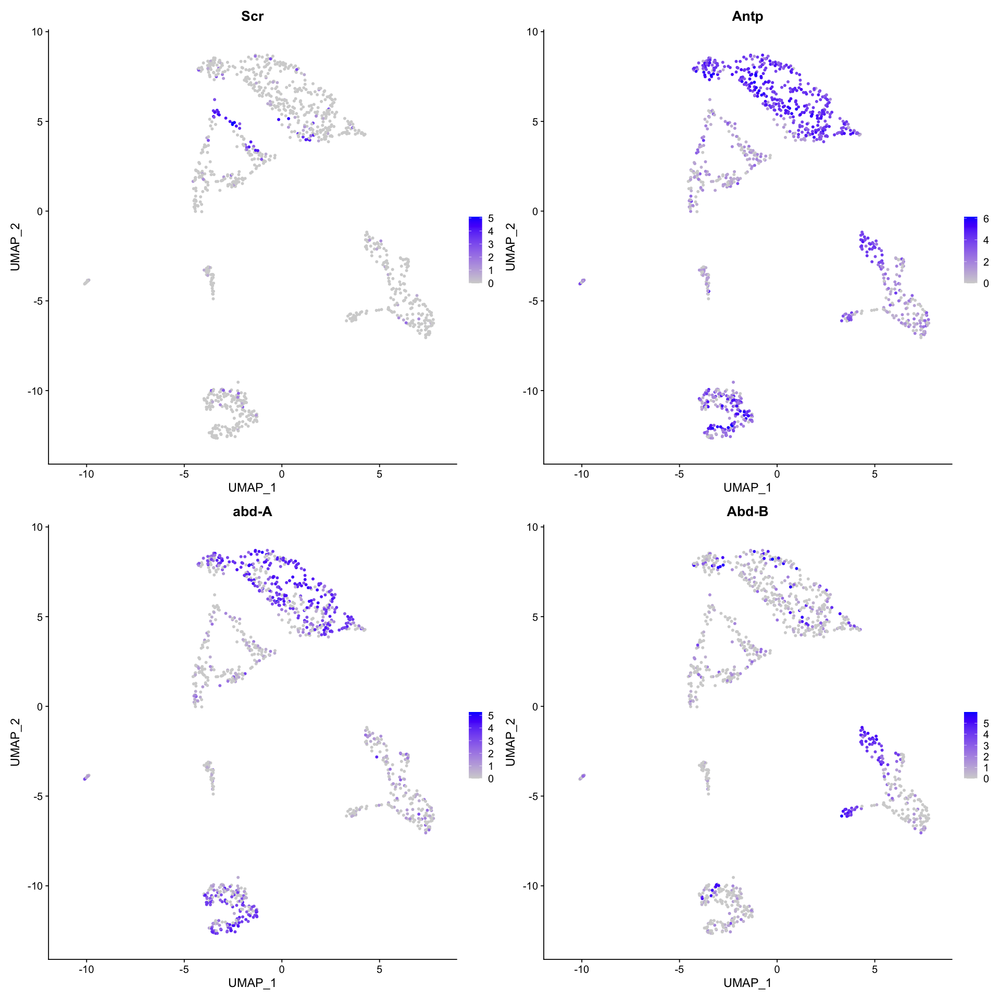

In [44]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('Scr', 'Antp', 'abd-A', 'Abd-B'), reduction = 'umap')

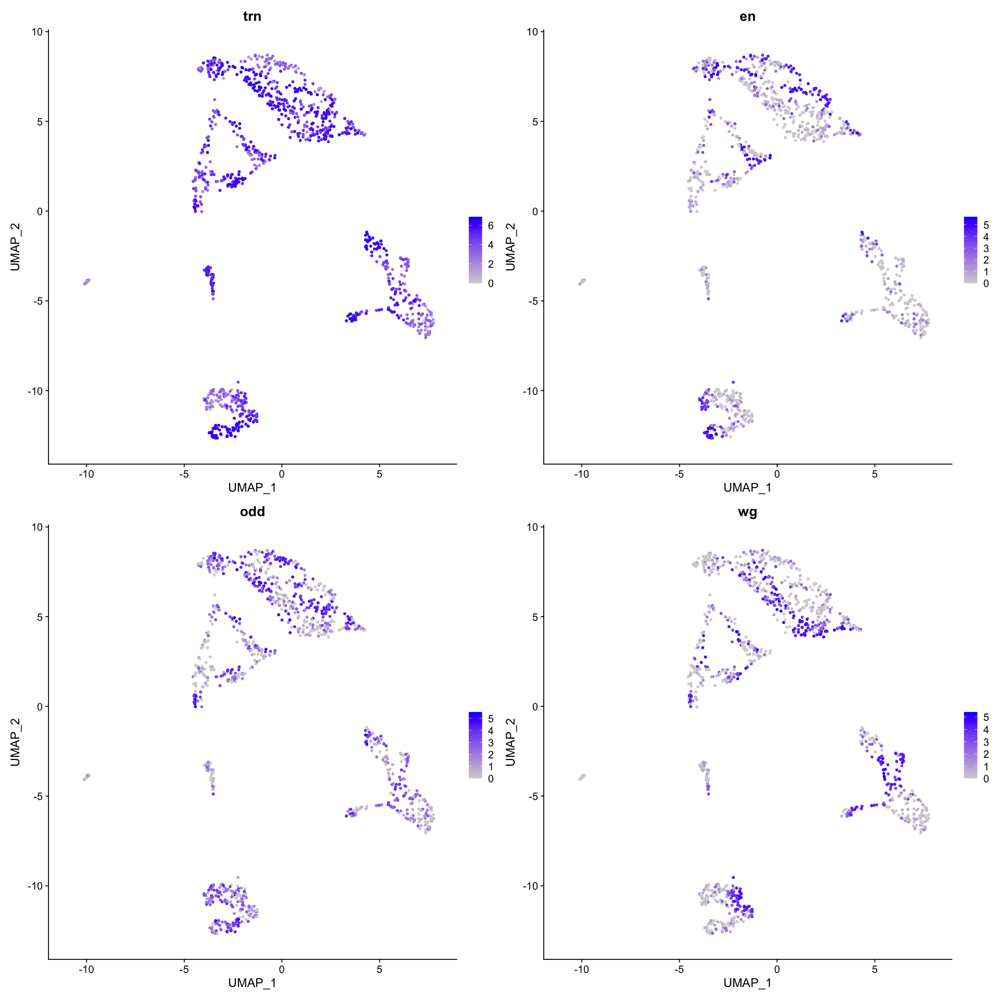

In [45]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('trn', 'en', 'odd', 'wg'), reduction = 'umap')

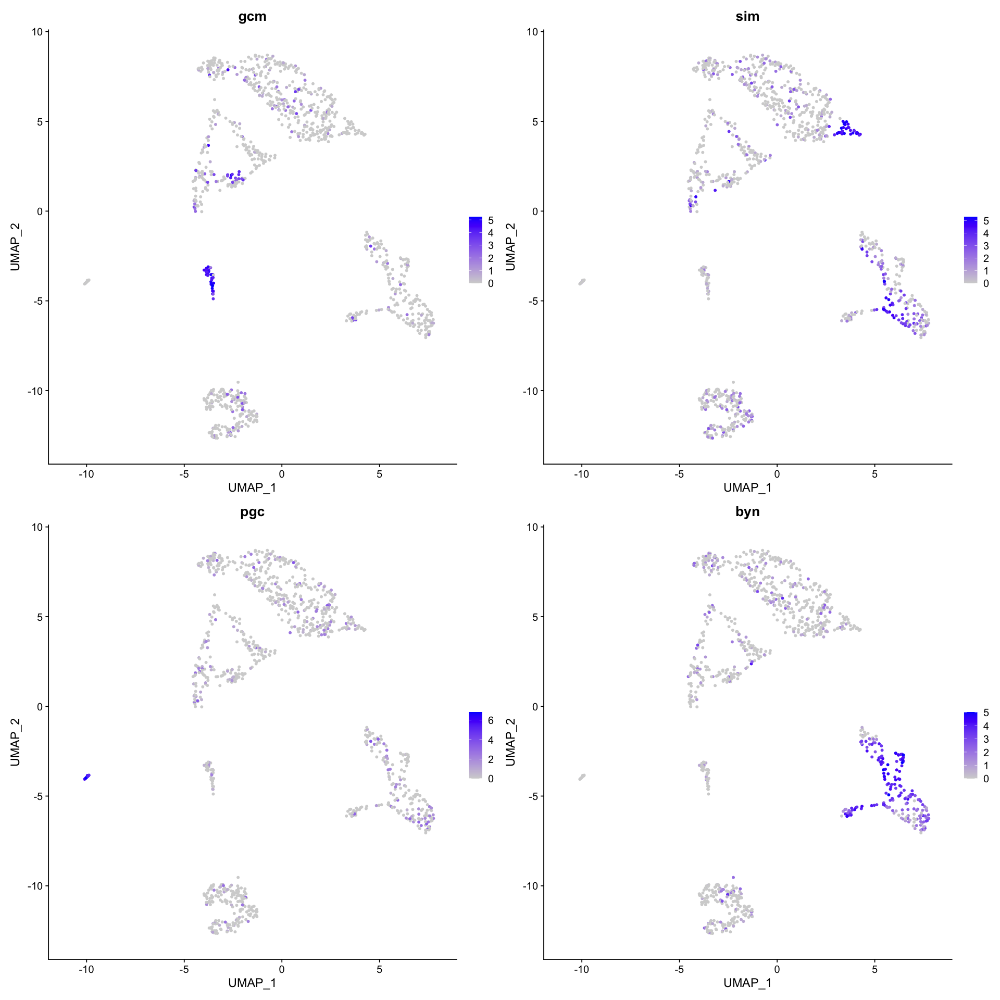

In [46]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC_nonstressed, features = c('gcm', 'sim', 'pgc', 'byn'), reduction = 'umap')

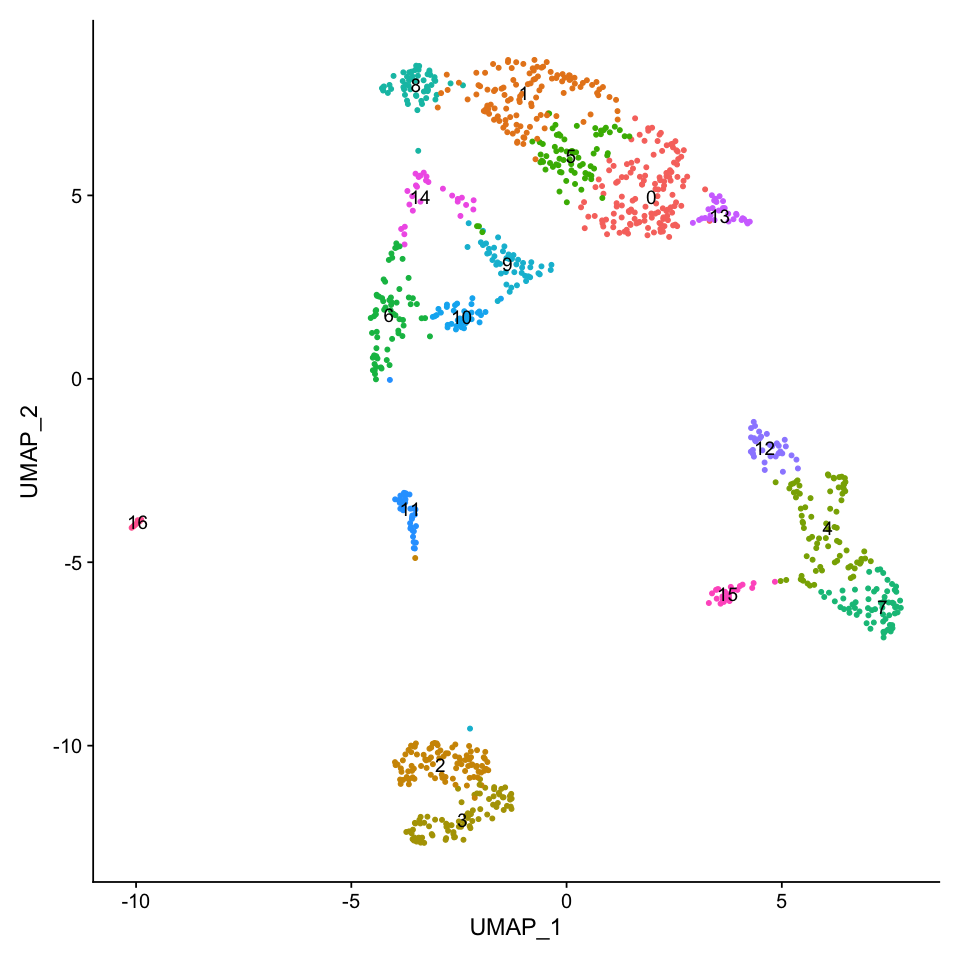

In [47]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC_nonstressed, reduction =  "umap", label = TRUE) + NoLegend()

## Cluster annotation

In [48]:
manual_id <- as.data.frame(seu_HQC_nonstressed$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID <- dplyr::recode(manual_id$manual_ID, 
                                "0" = "Trunk_medial_neuroectoderm",
                                "1" = "Trunk_dorsal_ectoderm",
                                "2" = "Trunk_mesoderm_odd",
                                "3" = "Trunk_mesoderm_even",
                                "4" = "Hindgut", 
                                "5" = "Trunk_lateral_neuroectoderm",
                                "6" = "Head_ectoderm",
                                "7" = "Posterior_midgut",
                                "8" = "Amnioserosa",
                                "9" = "Ectoderm_PS1", 
                                "10" = "Head_ectoderm_kn", 
                                "11" = "Anterior_mesoderm", 
                                "12" = "Ectoderm_PS14",
                                "13" = "Midline_cells", 
                                "14" = "Dorsal_ectoderm_PS2", 
                                "15" = "Posterior_mesoderm", 
                                "16" = "Pole_cells"
                                )
head(manual_id)

,manual_ID
,<fct>
batch1_col1CATCTG,4
batch1_col1GACTCA,5
batch1_col1GCTGAT,12
batch1_col1GTCTAC,14
batch1_col1TAGTCG,8
batch1_col1TCTAGC,12


,manual_ID
,<fct>
batch1_col1CATCTG,Hindgut
batch1_col1GACTCA,Trunk_lateral_neuroectoderm
batch1_col1GCTGAT,Ectoderm_PS14
batch1_col1GTCTAC,Dorsal_ectoderm_PS2
batch1_col1TAGTCG,Amnioserosa
batch1_col1TCTAGC,Ectoderm_PS14


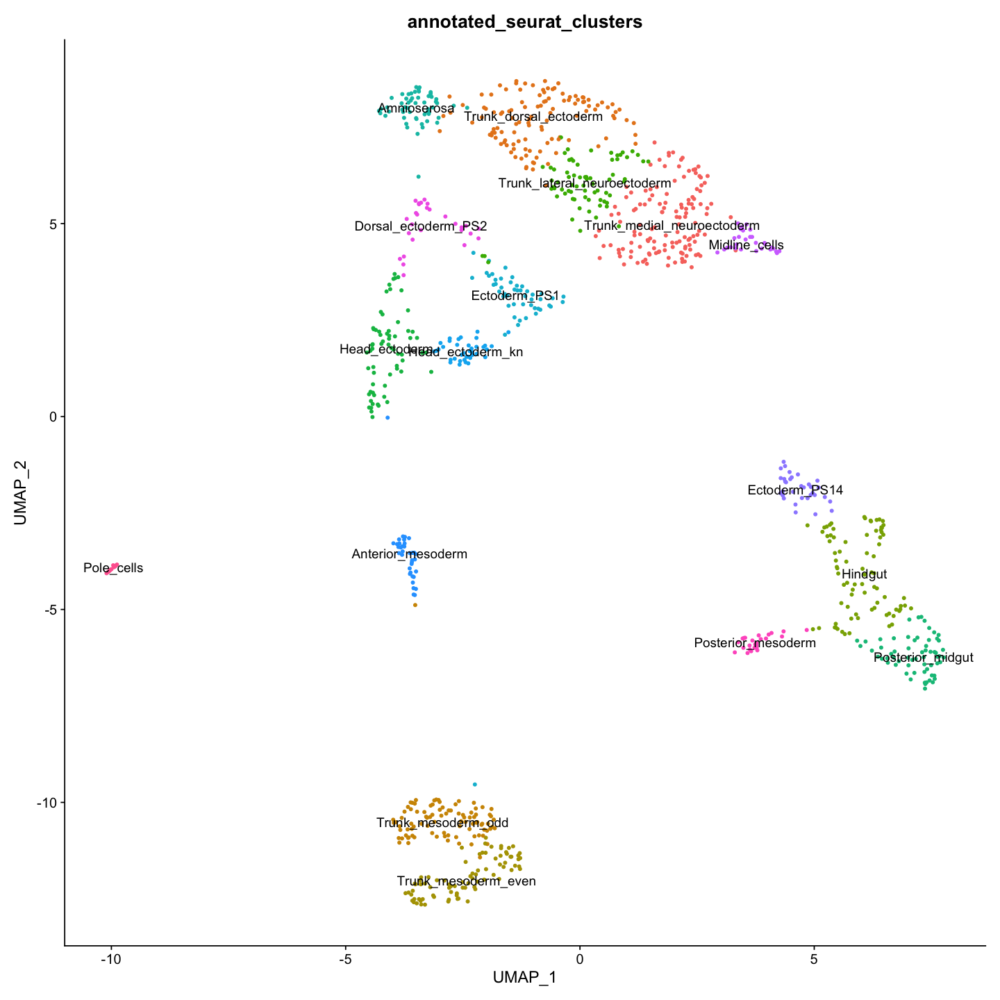

In [49]:
seu_HQC_nonstressed$annotated_seurat_clusters <- manual_id$manual_ID
options(repr.plot.width=12, repr.plot.height=12)
DimPlot(seu_HQC_nonstressed, reduction = 'umap', label = TRUE, group.by = 'annotated_seurat_clusters') + NoLegend()

In [50]:
write.csv(all.markers, file = './all_markers_seurat_clusters.csv')

In [51]:
saveRDS(obj = seu_HQC_nonstressed, file = '../../data/seurat_object/Set1/seu_HQC2_Set1.obj')

In [52]:
levels <- read.table(file="./seurat_clusters_rename_levels_color_without_tsr_high.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "Head_ectoderm"         "Head_ectoderm_kn"      "Ectoderm_PS1"         
[4] "Dorsal_ectoderm_PS2"   "Amnioserosa"           "Trunk_dorsal_ectoderm"

[1] 17

[1] "skyblue1"   "skyblue2"   "skyblue3"   "skyblue4"   "gray75"    
[6] "olivedrab2"

In [53]:
length(levels(seu_HQC_nonstressed))
levels(seu_HQC_nonstressed)
setdiff(seu_HQC_nonstressed$annotated_seurat_clusters, levels)

[1] 17

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16"

character(0)

In [54]:
Idents(seu_HQC_nonstressed) <- 'annotated_seurat_clusters'
levels(seu_HQC_nonstressed) <- levels

Saving 7 x 7 in image



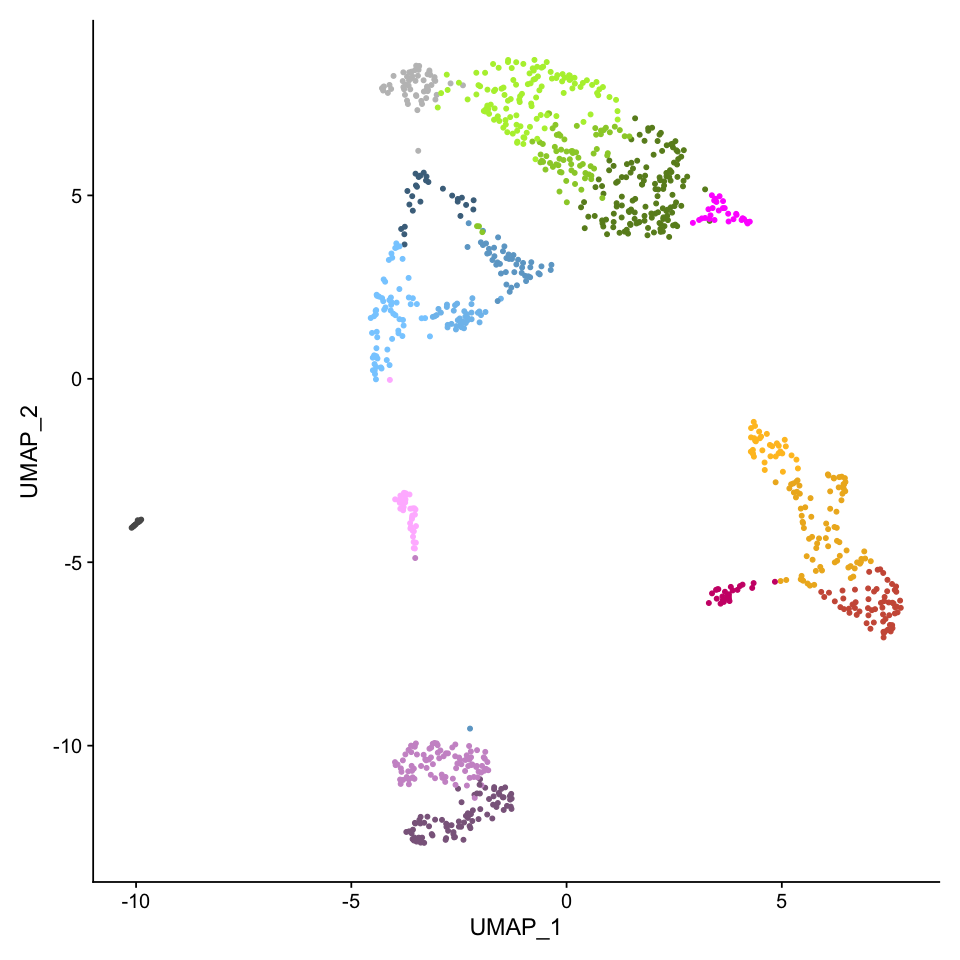

In [55]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_nonstressed, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/02_seurat_filter_stressed_cell/Without_tsr_high_seurat_cluster_umap_Set1.eps", dpi = 300)

Saving 7 x 7 in image



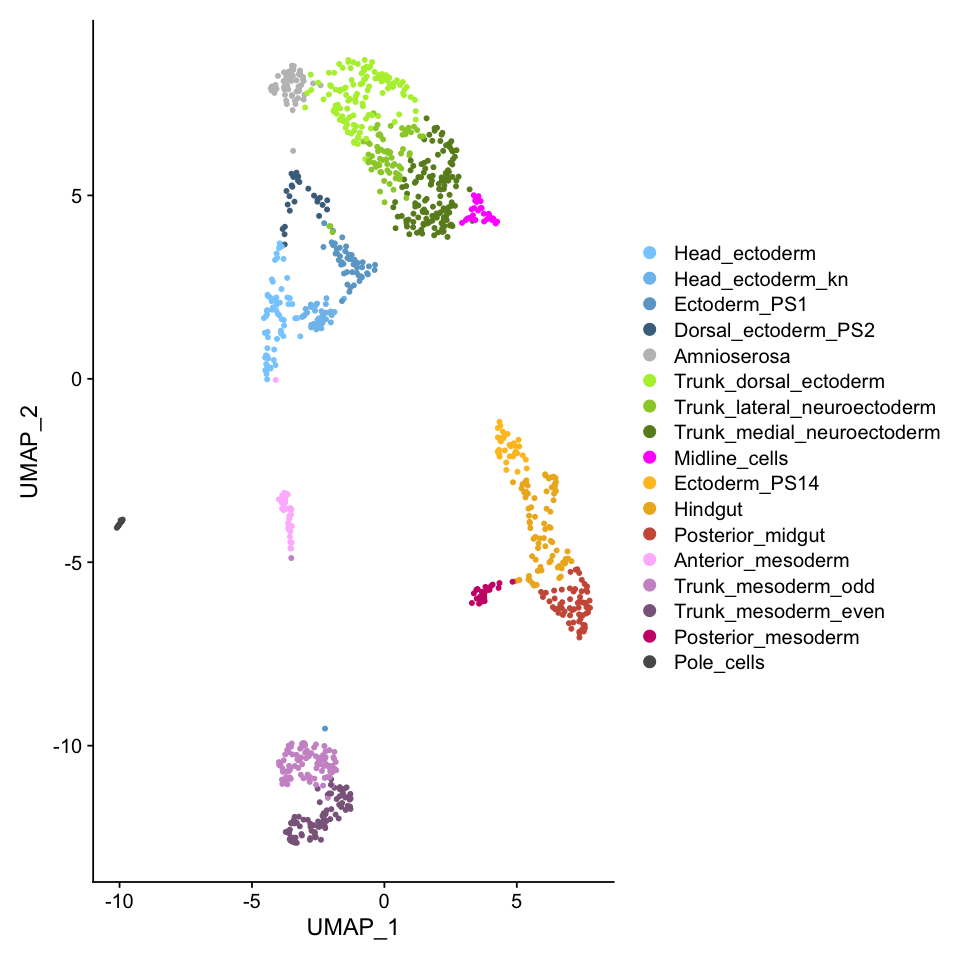

In [56]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_nonstressed, reduction =  "umap", label = FALSE, cols = colors) 
fig
ggsave(fig, file = "./figures/02_seurat_filter_stressed_cell/Without_tsr_high_seurat_cluster_umap2_Set1.eps", dpi = 300)

In [57]:
path = './figures/gene_expressions_on_UMAP_without_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC_nonstressed, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'Set1_all_cells_without_tsr_high.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [58]:
path = './figures/gene_expressions_on_UMAP_without_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC_nonstressed, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'Set1_all_cells_without_tsr_high_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [59]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] corrr_0.4.3                 mclust_5.4.7               
 [3] viridis_0.5.1               viridisLite_0.3.0          
 [5] MAST_1.16.0                 SingleCellExperiment_1.12.0
 [7] SummarizedExperiment_1.20.0 Biobase_2.50.0             
 [9] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
[11] IRanges_2.24.1              S4Vectors_0.28.1           
[13] BiocGenerics_0.36.0         MatrixGenerics_1.2.0       
[15] matrixStats_0.57.0          RColorBrewer_1